# Functional Analysis

1. Clustering + Heatmap

In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from matplotlib.gridspec import GridSpec

_REPO_ROOT = Path("/Users/elysiaye/caImageAnalysis")
sys.path.insert(0, str(_REPO_ROOT))
sys.path.insert(0, str(_REPO_ROOT / "notebooks"))

from caImageAnalysis.utils import calculate_fps

In [2]:
arinel_repo_path = r"/Volumes/Kobi/DOI_animals_good"
exp_folder = fr"{arinel_repo_path}/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925"

In [3]:
temporal_path = Path(r"/Volumes/Kobi/DOI_animals_good/temporal_pack_compact.h5")  # path to temporal_pack_compact.h5
df = pd.read_hdf(temporal_path, key="compact_temporal")

# Fish IDs to include in hierarchical clustering (empty list = use every fish in the pack)
fish_ids = [7, 8, 9, 13, 15, 17]  # list of fish_id's wanted to include in clustering
if fish_ids:
    avail = sorted(df["fish_id"].unique())
    df = df[df["fish_id"].isin(fish_ids)].copy()
    if df.empty:
        raise ValueError(f"No ROIs for fish_ids={fish_ids}. Available fish_id in pack: {avail}")

In [4]:
clusteringMat = np.stack(df["raw_norm_temporal"].to_numpy(), axis=0).astype(np.float64)
T_nframes = clusteringMat.shape[1]

def unique_pulse_frames(series):
    """All distinct frame indices appearing in pulse_frames (any row)."""
    out = set()
    if series is None or series.empty:
        return []
    for pulses in series.dropna():
        if pulses is None:
            continue
        try:
            for v in np.asarray(pulses, dtype=float).ravel():
                if np.isfinite(v):
                    out.add(int(v))
        except (TypeError, ValueError):
            continue
    return sorted(out)

pulse_frames = list(unique_pulse_frames(df["pulse_frames"]) if "pulse_frames" in df.columns else [])

n_fish = df["fish_id"].nunique()
fish_line = f"subset {fish_ids}" if fish_ids else "all fish in pack"
print(f"{temporal_path}: {clusteringMat.shape[0]} ROIs, {n_fish} fish ({fish_line}) × {T_nframes} frames")
print(f"pulse_frames (unique from column): {pulse_frames}")

/Volumes/Kobi/DOI_animals_good/temporal_pack_compact.h5: 44569 ROIs, 6 fish (subset [7, 8, 9, 13, 15, 17]) × 1606 frames
pulse_frames (unique from column): [292]


In [5]:
# Where to save the heatmap; None = skip saving in the next cell
figure_save_dir = Path("/Users/elysiaye/Desktop/clustering images")  # or None

_ids_str = ",".join(str(int(x)) for x in sorted(df["fish_id"].unique()))
figure_save_path = (
    Path(figure_save_dir) / f"heatmap_[{_ids_str}].png"
    if figure_save_dir is not None
    else None
)

/var/folders/5s/q3x21d8j6jvcnr7nmcb5xkwr0000gn/T/ipykernel_28993/3472931387.py:137: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.99])


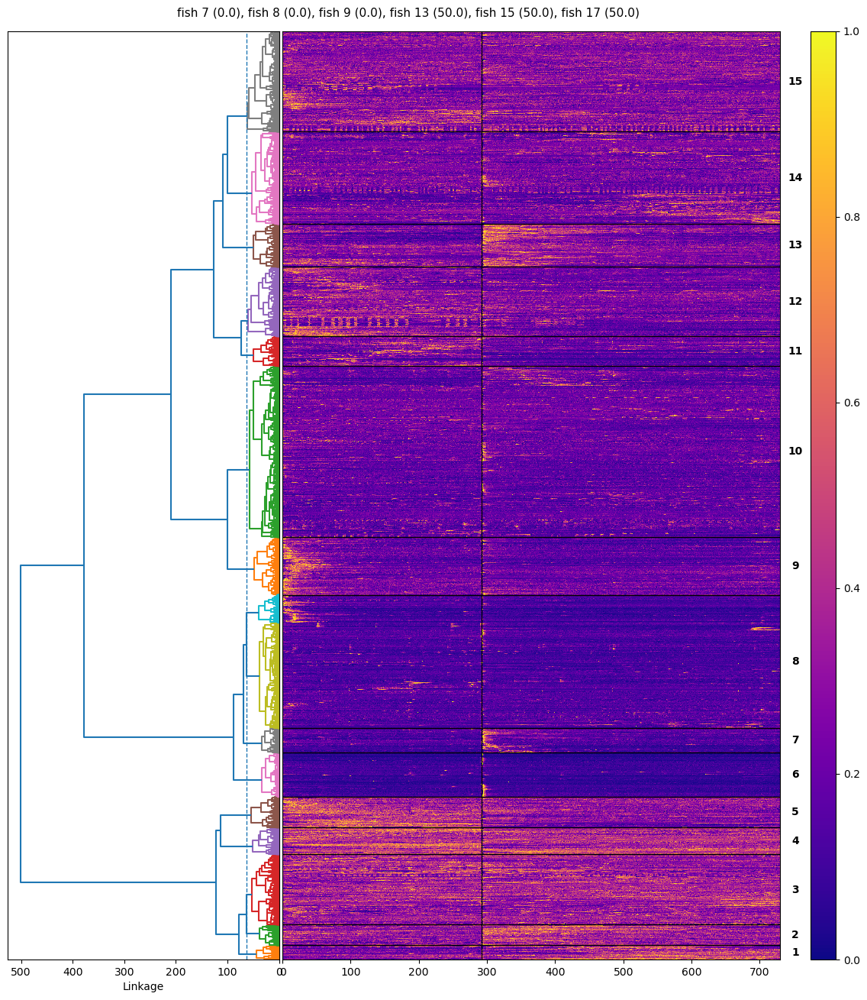

In [6]:
# clusteringMat: rows = observations, columns = features
# Cluster only on frames 0..729 (exclude frame 730 onward); heatmap below still shows full trace.
frame_stop_cluster = min(730, clusteringMat.shape[1])
X = clusteringMat[:, :frame_stop_cluster]

# Hierarchical clustering
Z = linkage(X, method="ward", metric="euclidean")

# Cluster assignment: set `n_clusters` to an int (e.g. 8), or None to cut by linkage distance
n_clusters = 15
cutoff_frac = 0.3

n_obs = Z.shape[0] + 1
if n_clusters is not None:
    n_clusters = int(n_clusters)
    if not 1 <= n_clusters <= n_obs:
        raise ValueError(f"n_clusters must be between 1 and {n_obs}, got {n_clusters}")
    T = fcluster(Z, t=n_clusters, criterion="maxclust")
    if n_clusters >= n_obs:
        cut_dist = 0.0
    elif n_clusters <= 1:
        cut_dist = float(Z[-1, 2])
    else:
        cut_dist = float(Z[n_obs - n_clusters - 1, 2])
else:
    cut_dist = cutoff_frac * np.max(Z[:, 2])
    T = fcluster(Z, t=cut_dist, criterion="distance")

# Get row order from dendrogram
d = dendrogram(
    Z,
    orientation="left",
    no_labels=True,
    color_threshold=cut_dist,
    no_plot=True
)
order = d["leaves"][::-1]   # remove [::-1] if the order looks upside down

# Reorder matrix and cluster labels
X_sorted = clusteringMat[order, :frame_stop_cluster]
T_sorted = T[order]

# Figure title: fish ID(s) and concentration(s) for this subset
if "concentration" in df.columns:
    _fc = (
        df.groupby("fish_id", sort=True)["concentration"]
        .first()
        .reset_index()
        .sort_values("fish_id")
    )
    plot_title = ", ".join(
        f"fish {int(r['fish_id'])} ({r['concentration']})" for _, r in _fc.iterrows()
    )
else:
    plot_title = ", ".join(
        f"fish {int(x)}" for x in sorted(df["fish_id"].unique())
    )

# Create figure layout: dendrogram | heatmap | cluster IDs | colorbar
fig = plt.figure(figsize=(14, 14), facecolor="white")
gs = GridSpec(1, 4, width_ratios=[1.2, 2.2, 0.11, 0.11], wspace=0.015)

ax1 = fig.add_subplot(gs[0, 0])   # dendrogram
ax2 = fig.add_subplot(gs[0, 1])   # heatmap
ax_lab = fig.add_subplot(gs[0, 2], sharey=ax2)  # cluster numbers (row-aligned)
ax3 = fig.add_subplot(gs[0, 3])   # colorbar

# Plot dendrogram
dendrogram(
    Z,
    orientation="left",
    no_labels=True,
    color_threshold=cut_dist,
    ax=ax1
)
ax1.set_yticks([])
ax1.set_xlabel("Linkage")
ax1.axvline(cut_dist, linestyle="--", linewidth=1)

# Plot heatmap
# raw_norm_temporal is per-trace min–max scaled to [0, 1]
im = ax2.imshow(
    X_sorted,
    aspect="auto",
    interpolation="nearest",
    cmap="plasma",
    vmin=0,
    vmax=1,
)
ax2.set_yticks([])

# Vertical lines at stimulus pulse frames (x = 0-based frame index = heatmap column)
for pf in pulse_frames:
    ax2.axvline(pf, color="k", linewidth=0.8, zorder=5)

# Dashed divider between frame 729 and 730 (0-based indexing)
ax2.axvline(729.5, color="lime", linestyle="--", linewidth=0.7, zorder=6)

ax2.axvline(292.5, color="k", linewidth=0.8, zorder=6)

# Draw horizontal lines where cluster identity changes
for i in range(len(T_sorted) - 1):
    if T_sorted[i] != T_sorted[i + 1]:
        ax2.axhline(i + 0.5, color="k", linewidth=1)

# Add cluster labels in the middle of each block
starts = [0]
for i in range(1, len(T_sorted)):
    if T_sorted[i] != T_sorted[i - 1]:
        starts.append(i)
ends = starts[1:] + [len(T_sorted)]

ax_lab.set_xlim(0, 1)
ax_lab.set_xticks([])
ax_lab.tick_params(axis="y", left=False, labelleft=False)
ax_lab.tick_params(axis="x", bottom=False, labelbottom=False)
for spine in ax_lab.spines.values():
    spine.set_visible(False)

for s, e in zip(starts, ends):
    ymid = (s + e - 1) / 2
    ax_lab.text(
        0.5,
        ymid,
        str(T_sorted[s]),
        ha="center",
        va="center",
        fontsize=10,
        fontweight="bold",
        color="k",
        clip_on=False,
    )

# Colorbar
plt.colorbar(im, cax=ax3)

plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.subplots_adjust(top=0.978)
fig.suptitle(plot_title, fontsize=11, y=1.0, verticalalignment="top")
plt.show()


In [7]:
if figure_save_path is not None:
    _out = Path(figure_save_path)
    _out.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(_out, dpi=150, bbox_inches="tight", facecolor=fig.get_facecolor())
    print(f"Saved figure: {_out.resolve()}")


Saved figure: /Users/elysiaye/Desktop/clustering images/heatmap_[7,8,9,13,15,17].png


### Compute cluster-wise mean/SEM traces + plot

Saved figure: /Users/elysiaye/Desktop/clustering images/cluster_traces_[7,8,9,13,15,17].png


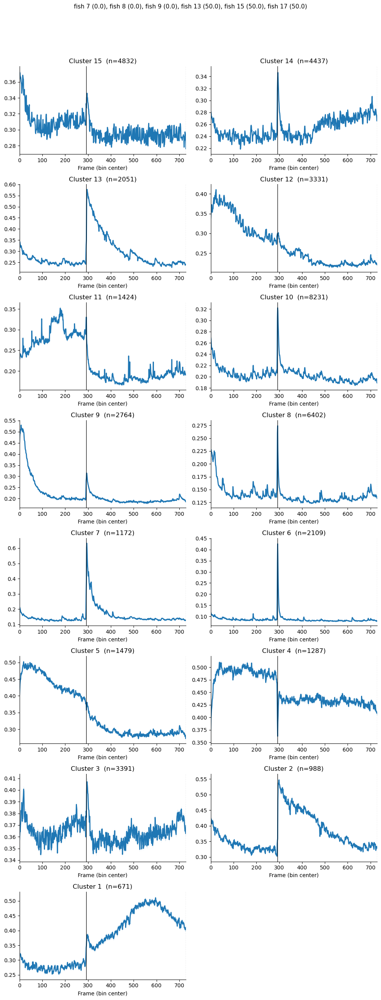

In [8]:
# Cluster mean ± SEM (uses X_sorted, T_sorted from clustering; optional pulse_frames, plot_title from above)
from plot import mean_sem, style_axis, unique_clusters_in_order, bin_time_observations

_pulse_frames = list(globals().get("pulse_frames") or [])

# Non-overlapping bin size along time (mean of N consecutive frames per bin)
frame_bin_size = 1

# Plot only frames 0..729.
frame_stop = min(730, X_sorted.shape[1])
X_plot = X_sorted[:, :frame_stop]

# X-axis: frame index (bin centers) or seconds
fps = None  # set e.g. 5.0 to use seconds; keep None for frame index
_, t_centers_frames = bin_time_observations(X_plot[:1, :], frame_bin_size)
if t_centers_frames.size == 0:
    raise ValueError(f"Need at least {frame_bin_size} frames to bin; got {X_plot.shape[1]}")
if fps is not None:
    t = t_centers_frames / float(fps)
    xlabel = "Time (s)"
    pulse_x = np.asarray(_pulse_frames, dtype=float) / float(fps)
else:
    t = t_centers_frames
    xlabel = "Frame (bin center)"
    pulse_x = np.asarray(_pulse_frames, dtype=float)

clust_ord = unique_clusters_in_order(T_sorted)
n_clust = len(clust_ord)
ncols = 2
nrows = int(np.ceil(n_clust / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(10, 3.5 * nrows), facecolor="white")
axes = np.atleast_1d(axes).ravel()

for idx, clust_id in enumerate(clust_ord):
    ax = axes[idx]
    cluster_mat = X_plot[T_sorted == clust_id, :]
    binned, _ = bin_time_observations(cluster_mat, frame_bin_size)
    cluster_mean, cluster_sem = mean_sem(binned)

    ax.plot(t, cluster_mean, linewidth=2, color="C0")
    ax.fill_between(
        t,
        cluster_mean - cluster_sem,
        cluster_mean + cluster_sem,
        alpha=0.25,
        color="C0",
        linewidth=0,
    )

    for px in pulse_x:
        ax.axvline(px, color="k", linewidth=0.8, zorder=5)

    # Dotted divider between frame 729 and 730 (match heatmap; 0-based indexing)
    ax.axvline(729.5, color="k", linestyle="--", linewidth=0.8, zorder=6)
    ax.axvline(292.5, color="k", linewidth=0.8, zorder=6)

    ax.set_title(f"Cluster {int(clust_id)}  (n={cluster_mat.shape[0]})")
    ax.set_xlim(float(t.min()), float(t.max()))
    ax.set_xlabel(xlabel)
    ax.tick_params(direction="out")
    style_axis(ax)

for j in range(n_clust, len(axes)):
    axes[j].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.88])
_pt = globals().get("plot_title")
if _pt is not None:
    fig.suptitle(_pt, fontsize=11, y=0.92, verticalalignment="bottom")

_fsd = globals().get("figure_save_dir")
_ids = globals().get("_ids_str", "subset")
figure_save_path_traces = (
    Path(_fsd) / f"cluster_traces_[{_ids}].png"
    if _fsd is not None
    else None
)
if figure_save_path_traces is not None:
    _out = Path(figure_save_path_traces)
    _out.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(_out, dpi=150, bbox_inches="tight", facecolor=fig.get_facecolor())
    print(f"Saved figure: {_out.resolve()}")

plt.show()

### Dendrogram + heatmap from saved arrays

Load `Z.npy`, `X_sorted.npy`, `T_sorted.npy`, and `T.npy` from a folder (plus optional `d.pkl` / `order.npy` for your records). Set `clustering_snapshot_dir` to that folder.

In the next cell, set **`n_clusters_plot`** to an integer to re-cut the tree with `fcluster(..., criterion="maxclust")`, or **`None`** to use the saved `T` / `T_sorted` files as-is.

/var/folders/5s/q3x21d8j6jvcnr7nmcb5xkwr0000gn/T/ipykernel_28891/2602416828.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.99])


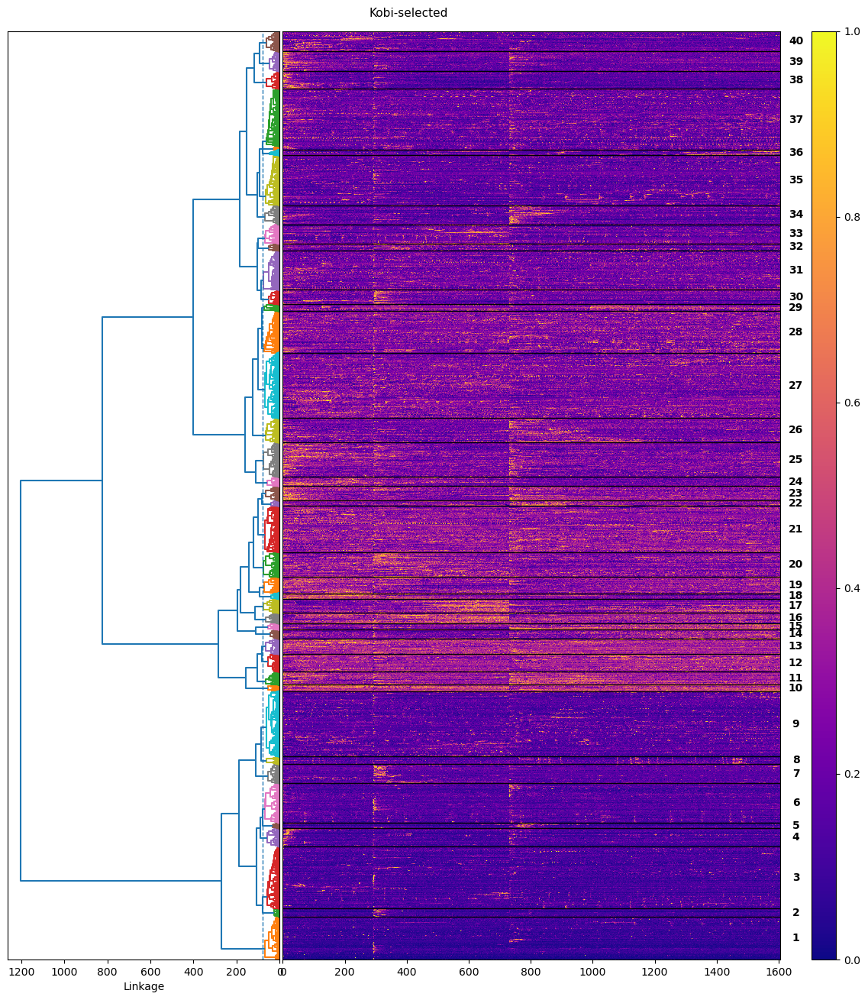

In [3]:
from pathlib import Path

from scipy.cluster.hierarchy import dendrogram, fcluster

# Folder containing: Z.npy, X_sorted.npy, T_sorted.npy, T.npy
# (order.npy / d.pkl are optional metadata; not needed if the sorted matrices are saved.)
clustering_snapshot_dir = Path("/Users/elysiaye/Downloads/Kobi-selected")

# Re-cut the tree: set to an int (``fcluster`` ``maxclust``). None = use saved T.npy / T_sorted.npy.
n_clusters_plot = 40

# Plot only frames 0..729.
frame_stop = 1606

Z = np.load(clustering_snapshot_dir / "Z.npy")
X_sorted = np.load(clustering_snapshot_dir / "X_sorted.npy")
X_plot = X_sorted[:, :frame_stop]

n_obs = Z.shape[0] + 1

if n_clusters_plot is not None:
    n_clusters_plot = int(n_clusters_plot)
    if not 1 <= n_clusters_plot <= n_obs:
        raise ValueError(f"n_clusters_plot must be between 1 and {n_obs}, got {n_clusters_plot}")
    T = fcluster(Z, t=n_clusters_plot, criterion="maxclust")
    if n_clusters_plot >= n_obs:
        cut_dist = 0.0
    elif n_clusters_plot <= 1:
        cut_dist = float(Z[-1, 2])
    else:
        cut_dist = float(Z[n_obs - n_clusters_plot - 1, 2])
    _d0 = dendrogram(Z, orientation="left", no_labels=True, no_plot=True)
    order = np.asarray(_d0["leaves"][::-1])
    T_sorted = T[order]
else:
    T_sorted = np.asarray(np.load(clustering_snapshot_dir / "T_sorted.npy")).ravel()
    T = np.asarray(np.load(clustering_snapshot_dir / "T.npy")).ravel()
    n_clusters = len(np.unique(T))
    if n_clusters >= n_obs:
        cut_dist = 0.0
    elif n_clusters <= 1:
        cut_dist = float(Z[-1, 2])
    else:
        cut_dist = float(Z[n_obs - n_clusters - 1, 2])
    _cut_override = clustering_snapshot_dir / "cut_dist.npy"
    if _cut_override.is_file():
        cut_dist = float(np.load(_cut_override))

_snapshot_title = globals().get("plot_title")
fig_title = _snapshot_title if _snapshot_title is not None else clustering_snapshot_dir.name

_pulse = list(globals().get("pulse_frames") or [])

fig = plt.figure(figsize=(14, 14), facecolor="white")
gs = GridSpec(1, 4, width_ratios=[1.2, 2.2, 0.11, 0.11], wspace=0.015)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax_lab = fig.add_subplot(gs[0, 2], sharey=ax2)
ax3 = fig.add_subplot(gs[0, 3])

dendrogram(
    Z,
    orientation="left",
    no_labels=True,
    color_threshold=cut_dist,
    ax=ax1,
)
ax1.set_yticks([])
ax1.set_xlabel("Linkage")
ax1.axvline(cut_dist, linestyle="--", linewidth=1)

im = ax2.imshow(
    X_plot,
    aspect="auto",
    interpolation="nearest",
    cmap="plasma",
    vmin=0,
    vmax=1,
)
ax2.set_yticks([])

# for pf in _pulse: # that black line at injection
#     ax2.axvline(pf, color="k", linewidth=0.8, zorder=5)

# ax2.axvline(729.5, color="lime", linestyle="--", linewidth=0.7, zorder=6)

# ax2.axvline(292.5, color="k", linewidth=0.8, zorder=6)

for i in range(len(T_sorted) - 1):
    if T_sorted[i] != T_sorted[i + 1]:
        ax2.axhline(i + 0.5, color="k", linewidth=1)

starts = [0]
for i in range(1, len(T_sorted)):
    if T_sorted[i] != T_sorted[i - 1]:
        starts.append(i)
ends = starts[1:] + [len(T_sorted)]

ax_lab.set_xlim(0, 1)
ax_lab.set_xticks([])
ax_lab.tick_params(axis="y", left=False, labelleft=False)
ax_lab.tick_params(axis="x", bottom=False, labelbottom=False)
for spine in ax_lab.spines.values():
    spine.set_visible(False)

for s, e in zip(starts, ends):
    ymid = (s + e - 1) / 2
    ax_lab.text(
        0.5,
        ymid,
        str(T_sorted[s]),
        ha="center",
        va="center",
        fontsize=10,
        fontweight="bold",
        color="k",
        clip_on=False,
    )

plt.colorbar(im, cax=ax3)

plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.subplots_adjust(top=0.978)
fig.suptitle(fig_title, fontsize=11, y=1.0, verticalalignment="top")
plt.show()

### Cluster mean ± SEM traces (saved snapshot / workspace)

Same logic as the cell above, but intended to run after **loading arrays from disk** (cell with `Kobi-selected`) so `X_sorted` and `T_sorted` match that figure. If you ran the live clustering cell instead, this still uses whatever `X_sorted` / `T_sorted` are currently in memory.

Optional: set `cluster_traces_save_suffix` to tag saved PNGs (default `snapshot`).


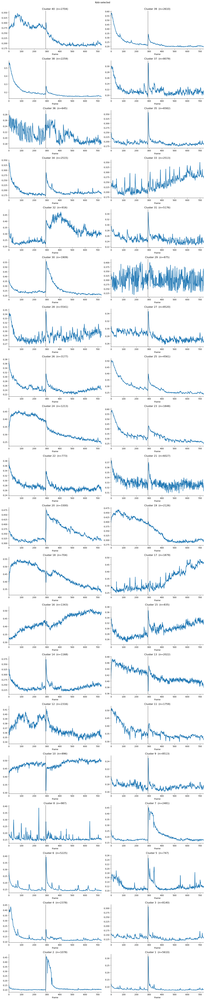

In [4]:
# Cluster mean ± SEM — same recipe as the main cluster-traces cell; uses current X_sorted, T_sorted
from pathlib import Path

from plot import mean_sem, style_axis, unique_clusters_in_order, bin_time_observations

pulse_frame = 290

frame_bin_size = 1

# Plot only frames 0..729.
frame_stop = 730
X_plot = X_sorted[:, :frame_stop]

fps = None
_, t_centers_frames = bin_time_observations(X_plot[:1, :], frame_bin_size)
if t_centers_frames.size == 0:
    raise ValueError(f"Need at least {frame_bin_size} frames to bin; got {X_plot.shape[1]}")
if fps is not None:
    t = t_centers_frames / float(fps)
    xlabel = "Time (s)"
    pulse_x = np.asarray([pulse_frame], dtype=float) / float(fps)
else:
    t = t_centers_frames
    xlabel = "Frame"
    pulse_x = np.asarray([pulse_frame], dtype=float)

clust_ord = unique_clusters_in_order(T_sorted)
n_clust = len(clust_ord)
ncols = 2
nrows = int(np.ceil(n_clust / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 3.5 * nrows), facecolor="white")
axes = np.atleast_1d(axes).ravel()

for idx, clust_id in enumerate(clust_ord):
    ax = axes[idx]
    cluster_mat = X_plot[T_sorted == clust_id, :]
    binned, _ = bin_time_observations(cluster_mat, frame_bin_size)
    cluster_mean, cluster_sem = mean_sem(binned)

    ax.plot(t, cluster_mean, linewidth=2, color="C0")
    ax.fill_between(
        t,
        cluster_mean - cluster_sem,
        cluster_mean + cluster_sem,
        alpha=0.25,
        color="C0",
        linewidth=0,
    )

    for px in pulse_x:
        ax.axvline(px, color="k", linewidth=0.8, zorder=5)


    ax.set_title(f"Cluster {int(clust_id)}  (n={cluster_mat.shape[0]})")
    ax.set_xlim(float(t.min()), float(t.max()))
    ax.set_xlabel(xlabel)
    ax.tick_params(direction="out")
    style_axis(ax)

for j in range(n_clust, len(axes)):
    axes[j].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
_pt = globals().get("plot_title")
_fig_title = _pt if _pt is not None else globals().get("fig_title")
if _fig_title is not None:
    fig.suptitle(_fig_title, fontsize=11, y=0.962, verticalalignment="bottom")

cluster_traces_save_suffix = "snapshot"
_fsd = globals().get("figure_save_dir")
_ids = globals().get("_ids_str", "subset")
figure_save_path_traces = (
    Path(_fsd) / f"cluster_traces_{cluster_traces_save_suffix}_[{_ids}].png"
    if _fsd is not None
    else None
)
if figure_save_path_traces is not None:
    _out = Path(figure_save_path_traces)
    _out.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(_out, dpi=150, bbox_inches="tight", facecolor=fig.get_facecolor())
    print(f"Saved figure: {_out.resolve()}")

plt.show()



In [5]:
calculate_fps('/Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/img_stack_0/frametimes.h5')

0.4999998888889136

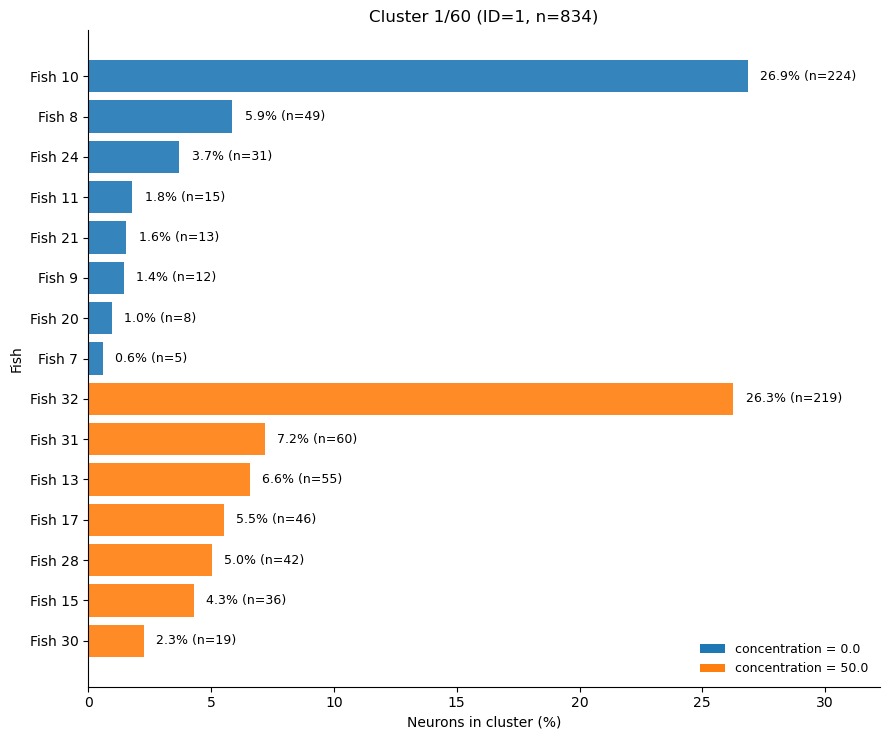

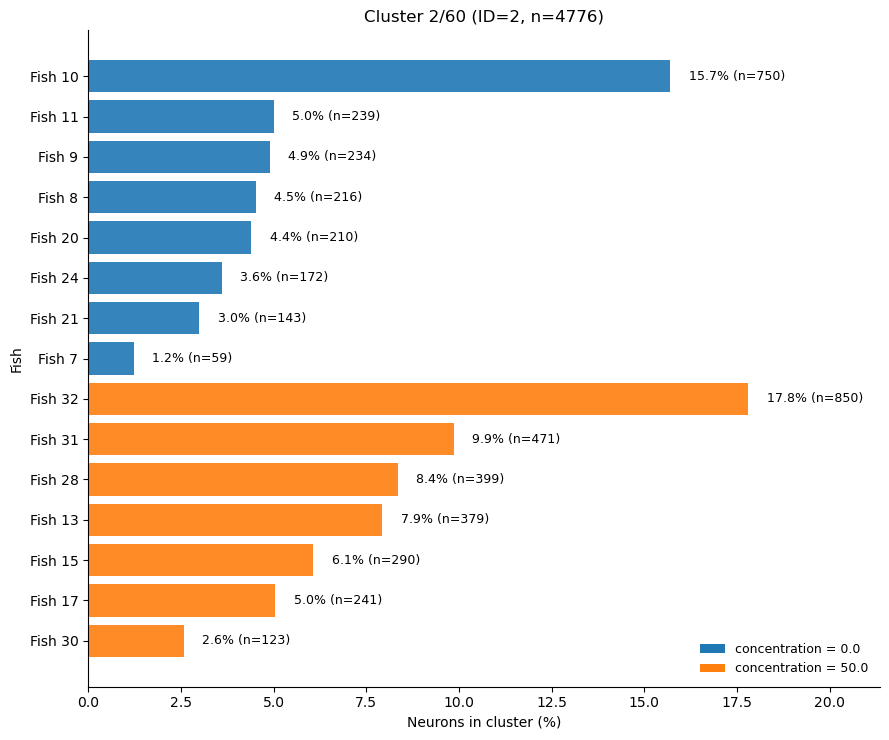

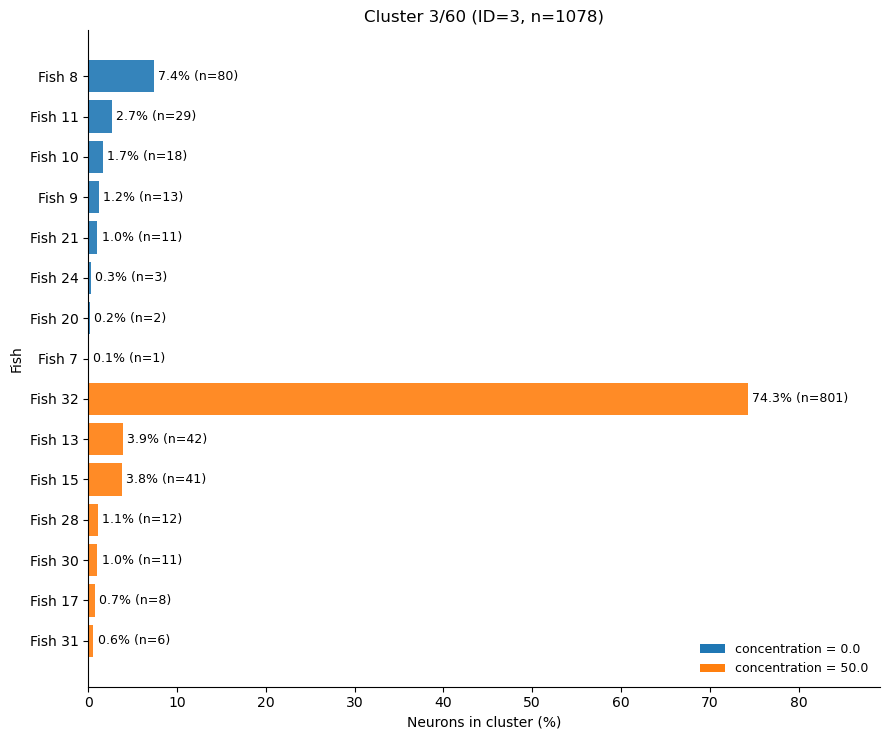

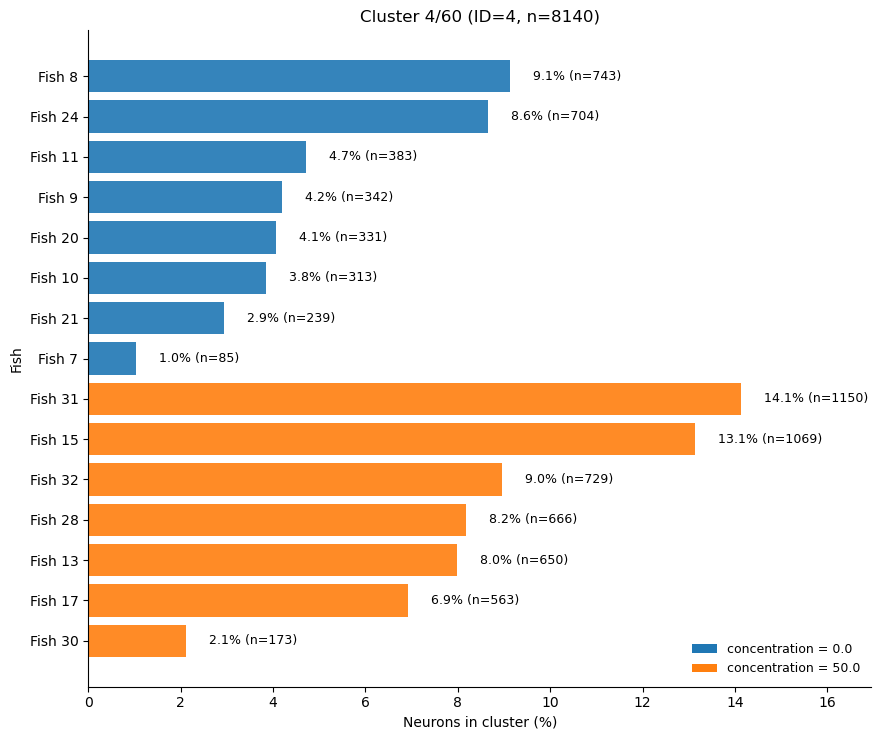

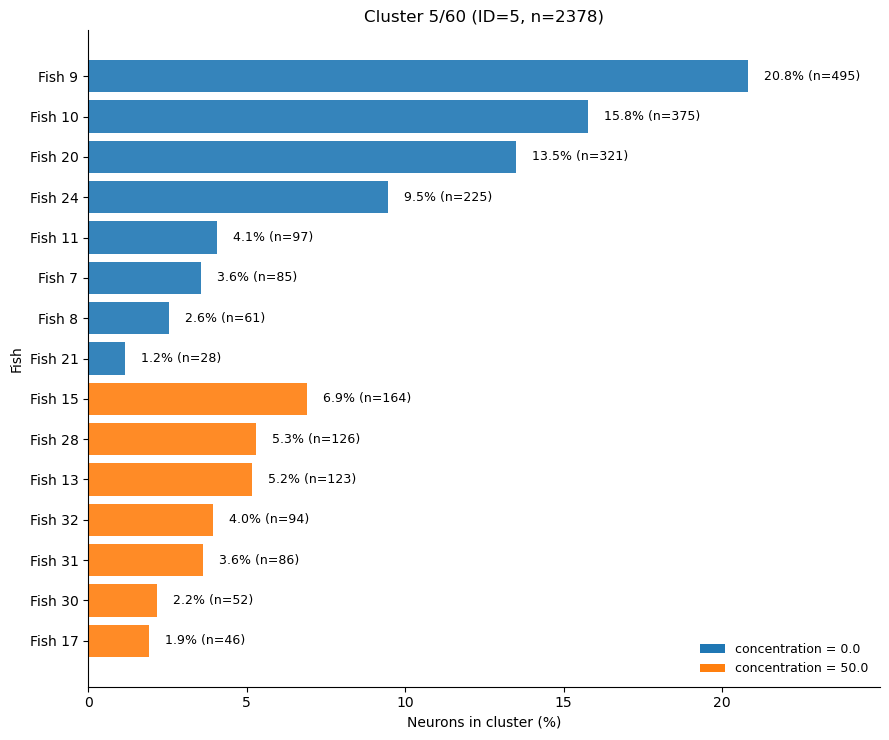

...

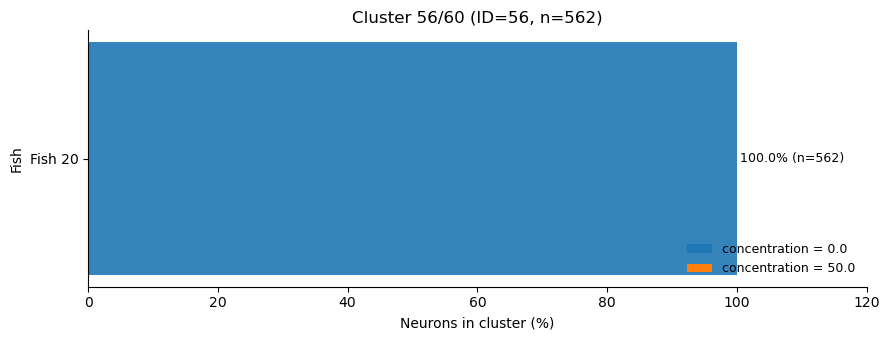

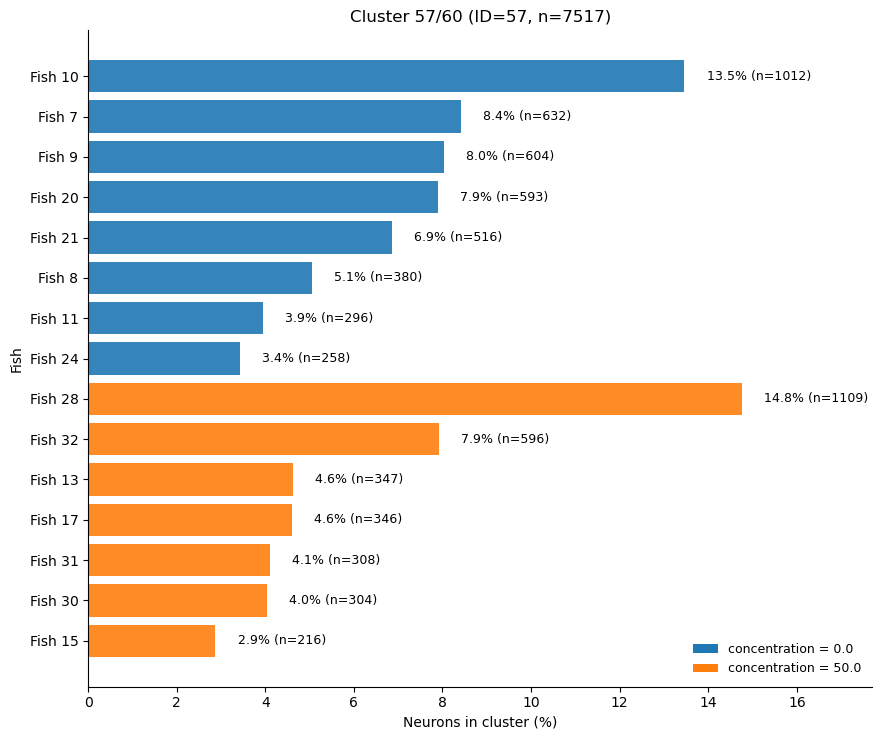

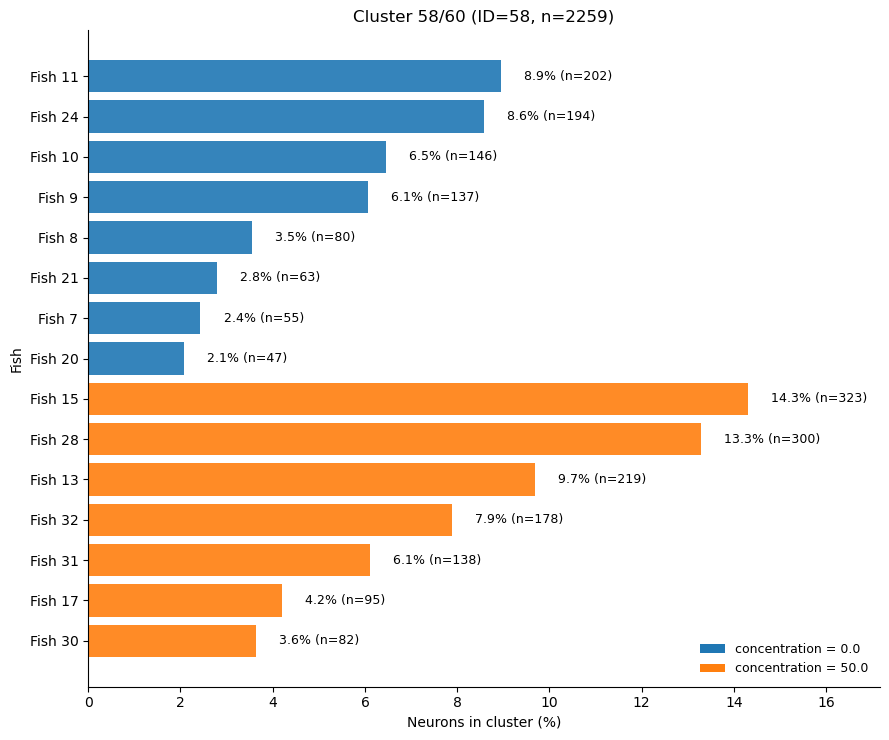

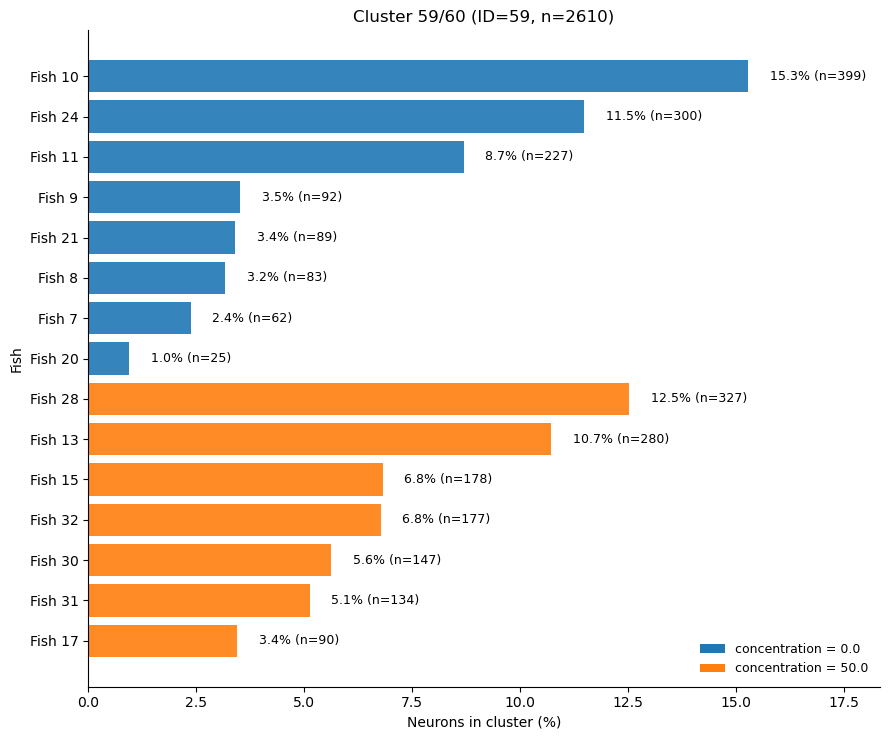

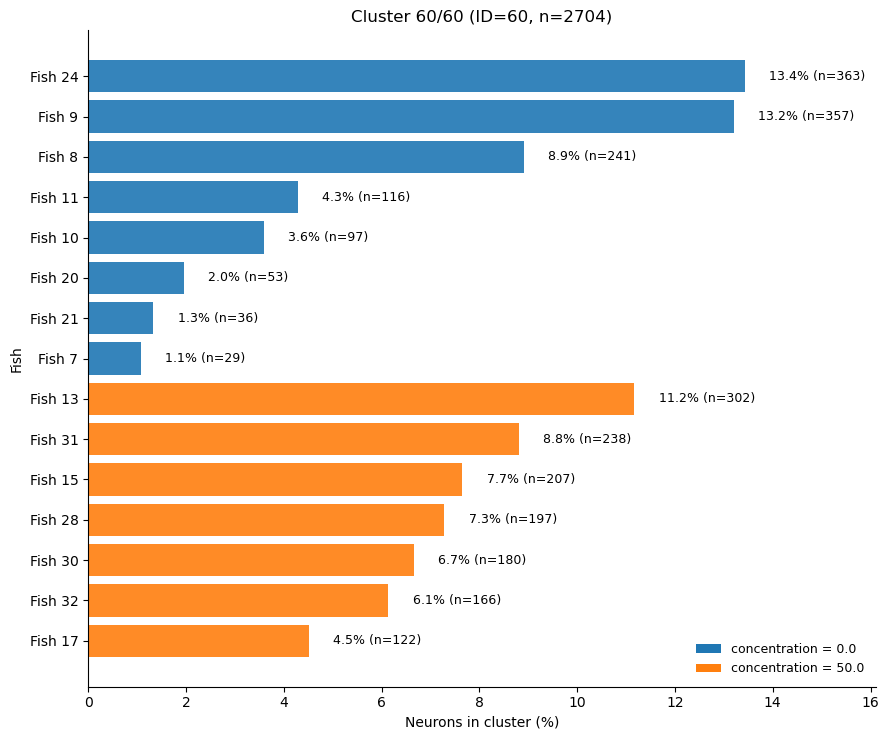

In [32]:
# Cluster composition by fish — iterate all clusters; horizontal % bars sorted by concentration (0.0 -> 50.0)
from pathlib import Path
from matplotlib.patches import Patch

# If `df` is not already in memory, load from the compact temporal pack.
_temporal_path = Path(globals().get("temporal_path", "/Volumes/Kobi/DOI_animals_good/temporal_pack_compact.h5"))
if "df" in globals() and isinstance(df, pd.DataFrame):
    _df_meta = df.copy()
else:
    _df_meta = pd.read_hdf(_temporal_path, key="compact_temporal")

# Use unsorted cluster labels when available (best alignment with df row order).
if "T" in globals() and len(np.asarray(T).ravel()) == len(_df_meta):
    _cluster_labels = np.asarray(T).ravel()
elif (
    "T_sorted" in globals()
    and len(np.asarray(T_sorted).ravel()) == len(_df_meta)
    and "order" in globals()
    and len(np.asarray(order).ravel()) == len(_df_meta)
):
    _df_meta = _df_meta.iloc[np.asarray(order).ravel()].reset_index(drop=True)
    _cluster_labels = np.asarray(T_sorted).ravel()
else:
    raise ValueError(
        "Could not align cluster labels to metadata. "
        "Need `T` (preferred), or `T_sorted` + `order`, with matching length to df."
    )

if "fish_id" not in _df_meta.columns:
    raise ValueError("`fish_id` column missing in temporal_pack_compact metadata.")
if "concentration" not in _df_meta.columns:
    raise ValueError("`concentration` column missing in temporal_pack_compact metadata.")

_df_meta = _df_meta.copy()
_df_meta["concentration"] = pd.to_numeric(_df_meta["concentration"], errors="coerce")
_cluster_ids = np.sort(np.unique(_cluster_labels))
_total_clusters = len(_cluster_ids)

# Sort bars by concentration (0.0 first, then 50.0), then by percentage.
_conc_order = {0.0: 0, 50.0: 1}
_conc_color_map = {0.0: "tab:blue", 50.0: "tab:orange"}

for _i, _cluster_id in enumerate(_cluster_ids, start=1):
    _mask = _cluster_labels == _cluster_id
    n_cluster = int(_mask.sum())
    if n_cluster == 0:
        continue

    _sub = _df_meta.loc[_mask, ["fish_id", "concentration"]].copy()

    _counts = (
        _sub.groupby(["concentration", "fish_id"], dropna=False)
        .size()
        .rename("n_neurons")
        .reset_index()
    )
    _counts["pct_cluster"] = 100.0 * _counts["n_neurons"] / float(n_cluster)
    _counts["_conc_sort"] = _counts["concentration"].map(_conc_order).fillna(99)
    _counts = _counts.sort_values(["_conc_sort", "pct_cluster", "fish_id"], ascending=[True, False, True])

    _counts["label"] = _counts["fish_id"].map(lambda v: f"Fish {int(v)}")
    _bar_colors = _counts["concentration"].map(_conc_color_map).fillna("tab:gray")

    fig, ax = plt.subplots(figsize=(9, max(3.5, 0.5 * len(_counts))), facecolor="white")
    ax.barh(_counts["label"], _counts["pct_cluster"], color=_bar_colors, alpha=0.9)
    ax.invert_yaxis()  # first (0.0 concentration) entries appear at the top
    ax.set_xlabel("Neurons in cluster (%)")
    ax.set_ylabel("Fish")
    ax.set_title(f"Cluster {_i}/{_total_clusters} (ID={int(_cluster_id)}, n={n_cluster})")

    for y, pct, n in zip(np.arange(len(_counts)), _counts["pct_cluster"], _counts["n_neurons"]):
        ax.text(pct + 0.5, y, f"{pct:.1f}% (n={int(n)})", va="center", fontsize=9)

    ax.set_xlim(0, max(5, float(_counts["pct_cluster"].max()) * 1.2))

    _legend_handles = [
        Patch(facecolor="tab:blue", edgecolor="none", label="concentration = 0.0"),
        Patch(facecolor="tab:orange", edgecolor="none", label="concentration = 50.0"),
    ]
    if _counts["concentration"].isna().any() or (~_counts["concentration"].isin([0.0, 50.0])).any():
        _legend_handles.append(Patch(facecolor="tab:gray", edgecolor="none", label="concentration = other/NaN"))
    ax.legend(handles=_legend_handles, loc="lower right", frameon=False, fontsize=9)

    ax.tick_params(direction="out")
    style_axis(ax)
    plt.tight_layout()
    plt.show()


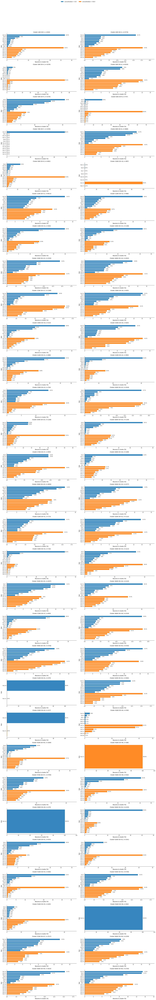

In [33]:
# Cluster composition by fish — all clusters in one figure (2 clusters per row)
from pathlib import Path
from matplotlib.patches import Patch

# If `df` is not already in memory, load from the compact temporal pack.
_temporal_path = Path(globals().get("temporal_path", "/Volumes/Kobi/DOI_animals_good/temporal_pack_compact.h5"))
if "df" in globals() and isinstance(df, pd.DataFrame):
    _df_meta = df.copy()
else:
    _df_meta = pd.read_hdf(_temporal_path, key="compact_temporal")

# Use unsorted cluster labels when available (best alignment with df row order).
if "T" in globals() and len(np.asarray(T).ravel()) == len(_df_meta):
    _cluster_labels = np.asarray(T).ravel()
elif (
    "T_sorted" in globals()
    and len(np.asarray(T_sorted).ravel()) == len(_df_meta)
    and "order" in globals()
    and len(np.asarray(order).ravel()) == len(_df_meta)
):
    _df_meta = _df_meta.iloc[np.asarray(order).ravel()].reset_index(drop=True)
    _cluster_labels = np.asarray(T_sorted).ravel()
else:
    raise ValueError(
        "Could not align cluster labels to metadata. "
        "Need `T` (preferred), or `T_sorted` + `order`, with matching length to df."
    )

if "fish_id" not in _df_meta.columns:
    raise ValueError("`fish_id` column missing in temporal_pack_compact metadata.")
if "concentration" not in _df_meta.columns:
    raise ValueError("`concentration` column missing in temporal_pack_compact metadata.")

_df_meta = _df_meta.copy()
_df_meta["concentration"] = pd.to_numeric(_df_meta["concentration"], errors="coerce")
_cluster_ids = np.sort(np.unique(_cluster_labels))
_total_clusters = len(_cluster_ids)

# Sort bars by concentration (0.0 first, then 50.0), then by percentage.
_conc_order = {0.0: 0, 50.0: 1}
_conc_color_map = {0.0: "tab:blue", 50.0: "tab:orange"}

# Build one shared figure with 2 cluster plots per row.
_ncols = 2
_nrows = int(np.ceil(_total_clusters / _ncols))
fig, axes = plt.subplots(_nrows, _ncols, figsize=(18, max(3.8 * _nrows, 5)), facecolor="white")
axes = np.atleast_1d(axes).ravel()

for _i, _cluster_id in enumerate(_cluster_ids, start=1):
    ax = axes[_i - 1]
    _mask = _cluster_labels == _cluster_id
    n_cluster = int(_mask.sum())

    _sub = _df_meta.loc[_mask, ["fish_id", "concentration"]].copy()
    _counts = (
        _sub.groupby(["concentration", "fish_id"], dropna=False)
        .size()
        .rename("n_neurons")
        .reset_index()
    )

    if _counts.empty:
        ax.axis("off")
        continue

    _counts["pct_cluster"] = 100.0 * _counts["n_neurons"] / float(n_cluster)
    _counts["_conc_sort"] = _counts["concentration"].map(_conc_order).fillna(99)
    _counts = _counts.sort_values(["_conc_sort", "pct_cluster", "fish_id"], ascending=[True, False, True])

    _counts["label"] = _counts["fish_id"].map(lambda v: f"Fish {int(v)}")
    _bar_colors = _counts["concentration"].map(_conc_color_map).fillna("tab:gray")

    ax.barh(_counts["label"], _counts["pct_cluster"], color=_bar_colors, alpha=0.9)
    ax.invert_yaxis()  # first (0.0 concentration) entries appear at the top
    ax.set_xlabel("Neurons in cluster (%)")
    ax.set_ylabel("Fish")
    ax.set_title(f"Cluster {_i}/{_total_clusters} (ID={int(_cluster_id)}, n={n_cluster})", fontsize=10)

    for y, pct in zip(np.arange(len(_counts)), _counts["pct_cluster"]):
        ax.text(pct + 0.4, y, f"{pct:.1f}%", va="center", fontsize=8)

    ax.set_xlim(0, max(5, float(_counts["pct_cluster"].max()) * 1.2))
    ax.tick_params(direction="out", labelsize=8)
    style_axis(ax)

# Turn off any unused axes.
for _j in range(_total_clusters, len(axes)):
    axes[_j].axis("off")

# Single legend for the whole figure.
_legend_handles = [
    Patch(facecolor="tab:blue", edgecolor="none", label="concentration = 0.0"),
    Patch(facecolor="tab:orange", edgecolor="none", label="concentration = 50.0"),
]
if _df_meta["concentration"].isna().any() or (~_df_meta["concentration"].isin([0.0, 50.0])).any():
    _legend_handles.append(Patch(facecolor="tab:gray", edgecolor="none", label="concentration = other/NaN"))
fig.legend(handles=_legend_handles, loc="upper center", ncol=len(_legend_handles), frameon=False, fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


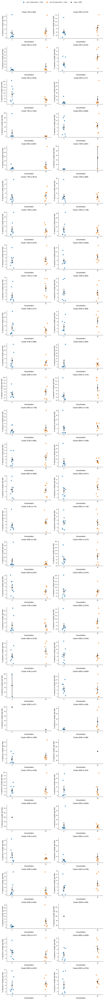

In [40]:
# Cluster fish scatter: x = concentration (0 vs 50), y = % neurons in cluster per fish; mean ± SEM per group
from pathlib import Path

from matplotlib.lines import Line2D

plt.rcParams.update(
    {
        "font.family": "sans-serif",
        "font.sans-serif": ["Helvetica", "Helvetica Neue", "Arial"],
    }
)


def _sem(a):
    a = np.asarray(a, dtype=float).ravel()
    a = a[np.isfinite(a)]
    n = a.size
    if n <= 1:
        return 0.0
    return float(np.std(a, ddof=1) / np.sqrt(n))


_temporal_path = Path(globals().get("temporal_path", "/Volumes/Kobi/DOI_animals_good/temporal_pack_compact.h5"))
if "df" in globals() and isinstance(df, pd.DataFrame):
    _df_meta = df.copy()
else:
    _df_meta = pd.read_hdf(_temporal_path, key="compact_temporal")

if "T" in globals() and len(np.asarray(T).ravel()) == len(_df_meta):
    _cluster_labels = np.asarray(T).ravel()
elif (
    "T_sorted" in globals()
    and len(np.asarray(T_sorted).ravel()) == len(_df_meta)
    and "order" in globals()
    and len(np.asarray(order).ravel()) == len(_df_meta)
):
    _df_meta = _df_meta.iloc[np.asarray(order).ravel()].reset_index(drop=True)
    _cluster_labels = np.asarray(T_sorted).ravel()
else:
    raise ValueError(
        "Could not align cluster labels to metadata. "
        "Need `T` (preferred), or `T_sorted` + `order`, with matching length to df."
    )

if "fish_id" not in _df_meta.columns or "concentration" not in _df_meta.columns:
    raise ValueError("Need `fish_id` and `concentration` in temporal pack.")

_df_meta = _df_meta.copy()
_df_meta["concentration"] = pd.to_numeric(_df_meta["concentration"], errors="coerce")
_cluster_ids = np.sort(np.unique(_cluster_labels))
_total_clusters = len(_cluster_ids)

# Plot x uses tight spacing (0 vs 1); tick labels still read 0 vs 50 concentration.
_x_plot = {0.0: 0.0, 50.0: 1.0}
_jitter_span = 0.07  # horizontal spread for multiple fish at same concentration
_scatter_colors = {0.0: "#1f77b4", 50.0: "#ff7f0e"}  # matplotlib blue / orange
_alpha_points = 0.9
_mean_ms = 3.8  # smaller mean marker

_ncols = 2
_nrows = int(np.ceil(_total_clusters / _ncols))
fig, axes = plt.subplots(_nrows, _ncols, figsize=(9.5, max(3.0 * _nrows, 3.6)), facecolor="white")
axes = np.atleast_1d(axes).ravel()

for _i, _cluster_id in enumerate(_cluster_ids, start=1):
    ax = axes[_i - 1]
    _mask = _cluster_labels == _cluster_id
    n_cluster = int(_mask.sum())
    if n_cluster == 0:
        ax.axis("off")
        continue

    _sub = _df_meta.loc[_mask, ["fish_id", "concentration"]].copy()
    _counts = (
        _sub.groupby(["concentration", "fish_id"], dropna=False)
        .size()
        .rename("n_neurons")
        .reset_index()
    )
    _counts["pct_cluster"] = 100.0 * _counts["n_neurons"] / float(n_cluster)

    for _conc_key, _x in _x_plot.items():
        _pcts = _counts.loc[_counts["concentration"] == _conc_key, "pct_cluster"].to_numpy(dtype=float)
        _pcts = _pcts[np.isfinite(_pcts)]
        _color = _scatter_colors.get(_conc_key, "#7f7f7f")
        _npts = len(_pcts)
        for _j, _pct in enumerate(_pcts):
            _jx = _x + (_j - 0.5 * (_npts - 1)) * _jitter_span if _npts > 1 else float(_x)
            ax.scatter(
                _jx,
                _pct,
                s=40,
                alpha=_alpha_points,
                color=_color,
                edgecolors="none",
                zorder=3,
            )
        if _npts:
            _m = float(np.mean(_pcts))
            _s = _sem(_pcts)
            ax.errorbar(
                _x,
                _m,
                yerr=_s,
                fmt="none",
                ecolor="k",
                elinewidth=1.4,
                capsize=3,
                zorder=4,
            )
            ax.plot(_x, _m, marker="s", markersize=_mean_ms, color="k", zorder=5)

    ax.set_xticks([0, 1])
    ax.set_xticklabels(["0", "50"])
    ax.set_xlabel("Concentration")
    ax.set_ylabel("% neurons in cluster (per fish)")
    ax.set_title(f"Cluster {_i}/{_total_clusters} (n={n_cluster})", fontsize=10)
    ax.set_xlim(-0.35, 1.35)
    ax.tick_params(direction="out", labelsize=8)
    style_axis(ax)

for _j in range(_total_clusters, len(axes)):
    axes[_j].axis("off")

_leg = [
    Line2D([0], [0], marker="o", color="w", markerfacecolor=_scatter_colors[0.0], markeredgecolor="none", markersize=8, label="conc 0 (each point = 1 fish)", alpha=_alpha_points),
    Line2D([0], [0], marker="o", color="w", markerfacecolor=_scatter_colors[50.0], markeredgecolor="none", markersize=8, label="conc 50 (each point = 1 fish)", alpha=_alpha_points),
    Line2D([0], [0], marker="s", color="k", linestyle="None", markersize=_mean_ms, label="mean ± SEM"),
]
plt.tight_layout(rect=[0, 0, 1, 0.995])
fig.legend(
    handles=_leg,
    loc="lower center",
    bbox_to_anchor=(0.5, 1.0),
    bbox_transform=fig.transFigure,
    ncol=3,
    frameon=False,
    fontsize=9,
    borderaxespad=0,
)
fig.subplots_adjust(top=0.99)
plt.show()
